In [37]:
import numpy as np
import pandas as pd
import pygmt
import os

from code import pbdb_dataset, paleoRotator, climateScenario, getBiomodSDMs, present_day_distribution
from importlib import reload
reload(pbdb_dataset)
reload(paleoRotator)
reload(climateScenario)
reload(getBiomodSDMs)
reload(present_day_distribution)

# Paths
pbdb_data_path = 'data/fossils/scleractinian_pbdb.csv'
pared_data_path = 'data/fossils/pared_danijela.csv'

paleoreef = pbdb_dataset.paredDataset(pared_data_path)
paleoreef.basic_df()

/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows/code/pbdb_dataset.py:81: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['longit'] = df['longit'].round(2)
/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows/code/pbdb_dataset.py:82: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['latit'] = df['latit'].round(2)


,lon,lat,age,age10,minAge,maxAge,name
0,106.88,23.77,244.08000,240.0,242.0,247.2,3766
1,22.92,40.73,244.08000,240.0,242.0,247.2,2984
2,18.08,50.57,244.08000,240.0,242.0,247.2,65
3,19.60,50.30,244.08000,240.0,242.0,247.2,525
4,19.50,50.08,244.08000,240.0,242.0,247.2,209
...,...,...,...,...,...,...,...
1417,167.02,-15.57,1.30085,0.0,0.0,0.1,3958
1418,33.54,26.57,1.30085,0.0,0.0,0.1,4078
1419,123.53,-9.50,1.30085,0.0,0.0,5.3,3586
1420,124.25,24.33,0.00585,0.0,0.0,0.0,3


In [38]:
ages = np.arange(0,260,10)
merdith_file = 'data/paleotemperature_datasets/Merdith2024/ALL_ON_r=1000_2025Feb13.obj'
pySCION_classes_path = 'data/paleotemperature_datasets/Merdith2024/pySCION_classes.py'
scotese_file = 'data/paleotemperature_datasets/scotese2021_paleotemps/Part 4. Phanerozoic_Paleotemperature_Summaryv4.xlsx'
phanDA_file = 'data/paleotemperature_datasets/PhanDA_GMSTandCO2_percentiles.csv'
grossmann_file = 'data/paleotemperature_datasets/paleotemperatures_Grossman_Joachimski_2022/41598_2022_11493_MOESM7_ESM.xlsx'

ebyte_rotationFile = f'data/reconstructions/Zahirovic_etal_2022_GDJ_NNR/CombinedRotations.rot'
ebyte_staticPolygonFile = f'data/reconstructions/Zahirovic_etal_2022_GDJ_NNR/StaticGeometries/StaticPolygons/Global_EarthByte_GPlates_PresentDay_StaticPlatePolygons.shp'
eByteRecon = paleoRotator.PaleoRotator(ebyte_rotationFile, ebyte_staticPolygonFile)
ebyteSimulationDirectory = 'data/climate_simulations/earthByte_paleomag'
co2s = [sim.split('_')[-1] for sim in os.listdir(ebyteSimulationDirectory) if not os.path.isfile(os.path.join(ebyteSimulationDirectory, sim))]
# ebyte GMST
ebyteScenario = climateScenario.ClimateScenario(ebyteSimulationDirectory, co2s, ages)
ebyte_modelGMST_df, ebyte_GMSTcurve_df = ebyteScenario.get_paleotemperature_df(var='puma_temperature_surface_air', merdith_file=merdith_file, pySCION_classes_path=pySCION_classes_path, scotese_file=scotese_file, phanDA_file=phanDA_file)
ebyte_matchingScenarios = ebyteScenario.get_matching_scenario(ebyte_modelGMST_df, ebyte_GMSTcurve_df)

scotese_rotationFile = '/Applications/GPlates_2.5.0/GeoData/FeatureCollections/AltPlateReconstructions/Scotese_PALEOMAP_GlobalPlateModel/PALEOMAP_PlateModel.rot'
scotese_static_polygon_file = "/Applications/GPlates_2.5.0/GeoData/FeatureCollections/AltPlateReconstructions/Scotese_PALEOMAP_GlobalPlateModel/PALEOMAP_TerranePolygons.gpmlz"
scoteseRecon = paleoRotator.PaleoRotator(scotese_rotationFile, scotese_static_polygon_file)
scoteseSimulationDirectory = 'data/climate_simulations/scotese'
scoteseScenario = climateScenario.ClimateScenario(scoteseSimulationDirectory, co2s, ages)
scotese_modelGMST_df, scotese_GMSTcurve_df = scoteseScenario.get_paleotemperature_df(var='puma_temperature_surface_air', merdith_file=merdith_file, pySCION_classes_path=pySCION_classes_path, scotese_file=scotese_file, phanDA_file=phanDA_file)
scotese_matchingScenarios = scoteseScenario.get_matching_scenario(scotese_modelGMST_df, scotese_GMSTcurve_df)


data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/100Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/110Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_200/40Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_200/50Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_200/100Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_P

## Load and reconstruct the pbdb/paleoreef data

In [32]:
pbdb = pbdb_dataset.PBDBDataset(pbdb_data_path)
# pbdb.df = pbdb.df.reset_index(drop=True)
pbdb.df


/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows/code/pbdb_dataset.py:20: DtypeWarning: Columns (3,56,57,58) have mixed types. Specify dtype option on import or set low_memory=False.
  self.df = pd.read_csv(self.csv_path, skiprows=list(range(0,18)))


,mid,occurrence_no,max_ma,min_ma,longit,latit,cc,pmodel,gplate,plong,plat,pmodel2,gplate2,plong2,plat2,rnd10
0,40.98,14784,48.070,33.9000,-90.169998,32.950279,US,gplates,101,-72.12,36.97,scotese,101,-80.73,33.87,40.0
1,39.37,19946,41.030,37.7100,-92.147224,32.234165,US,gplates,101,-74.86,36.59,scotese,101,-83.25,33.19,40.0
2,40.98,20071,48.070,33.9000,-92.003609,32.013332,US,gplates,101,-74.25,36.37,scotese,101,-82.69,33.09,40.0
3,40.98,20227,48.070,33.9000,-90.154999,32.333889,US,gplates,101,-72.27,36.37,scotese,101,-80.79,33.26,40.0
4,40.98,20473,48.070,33.9000,-88.688889,31.875000,US,gplates,101,-70.88,35.67,scotese,101,-79.37,32.68,40.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4834,57.62,1690914,59.240,56.0000,-120.681076,36.606056,US,gplates,130,-89.89,45.63,scotese,130,-99.59,41.79,60.0
4835,91.85,1691157,93.900,89.8000,-117.641991,33.745979,US,gplates,105,-75.37,39.12,scotese,105,-81.69,34.70,90.0
4836,63.83,1691172,66.000,61.6600,-122.612503,38.904446,US,gplates,130,-89.86,49.07,scotese,130,-100.44,44.77,60.0
4837,84.65,1693590,85.700,83.6000,26.585197,47.621880,RO,gplates,302,34.69,37.75,scotese,301,24.66,38.06,80.0


In [33]:
lons = pbdb.df['longit']
lats = pbdb.df['latit']
maxTimes = np.maximum(pbdb.df['max_ma'], pbdb.df['rnd10'] + 4.99)
minTimes = np.minimum(pbdb.df['min_ma'], pbdb.df['rnd10'] - 5)
gpml = eByteRecon.points2gpml(lons, lats, maxTimes, minTimes, names=pbdb.df['occurrence_no'])
# Save the GPML to a file
gpml.write('test.gpml')

pbdb.df['eByteGplate'] = [int(feature.get_reconstruction_plate_id()) for feature in gpml]
pbdb.df['eBytePlats'], pbdb.df['eBytePlons'] = eByteRecon.rotatePoints(gpml, pbdb.df['mid'], anchor_plate_id=701701)
# pbdb.df['eBytePlats10'], pbdb.df['eBytePlons10'] = eByteRecon.rotatePoints(gpml, pbdb.df['rnd10'], anchor_plate_id=701701)

# gpml = scoteseRecon.points2gpml(lons, lats, maxTimes, minTimes, names=pbdb.df['occurrence_no'])
gpml = scoteseRecon.points2gpml(lons, lats)
pbdb.df['scoGplate'] = [int(feature.get_reconstruction_plate_id()) for feature in gpml]
pbdb.df['scoPlats'], pbdb.df['scoPlons'] = scoteseRecon.rotatePoints(gpml, pbdb.df['mid'], anchor_plate_id=0)
# pbdb.df['scoPlats10'], pbdb.df['scoPlons10'] = scoteseRecon.rotatePoints(gpml, pbdb.df['rnd10'], anchor_plate_id=0)

Setting valid time for point 0: maxAge=48.07, minAge=33.9
Setting valid time for point 1: maxAge=44.99, minAge=35.0
Setting valid time for point 2: maxAge=48.07, minAge=33.9
Setting valid time for point 3: maxAge=48.07, minAge=33.9
Setting valid time for point 4: maxAge=48.07, minAge=33.9
Setting valid time for point 5: maxAge=74.99, minAge=65.0
Setting valid time for point 6: maxAge=124.99, minAge=113.2
Setting valid time for point 7: maxAge=114.99, minAge=105.0
Setting valid time for point 8: maxAge=124.99, minAge=113.2
Setting valid time for point 9: maxAge=124.99, minAge=113.2
Setting valid time for point 10: maxAge=124.99, minAge=113.2
Setting valid time for point 11: maxAge=125.77, minAge=115.0
Setting valid time for point 12: maxAge=124.99, minAge=113.2
Setting valid time for point 13: maxAge=144.99, minAge=135.0
Setting valid time for point 14: maxAge=137.05, minAge=125.0
Setting valid time for point 15: maxAge=124.99, minAge=115.0
Setting valid time for point 16: maxAge=137.05

## Get present-day photozoan distribution

In [34]:
reload(present_day_distribution)
presences_file = f'data/photozoan_locations/laugie2019_edit.png'
photozoans = present_day_distribution.present_day_photozoan_presences(presences_file)
photozoanArray = photozoans.mask_carbonates()
photozoanDS = photozoans.assign_to_xarray()

# photozoans.save_photozoan_to_csv('data/photozoan_locations')
# photozoans.save_filtered_photozoan_to_csv(presentday_goldstein_file='data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/0Ma_nc_outputs/gold_spn_av_0000003000_00.nc', output_dir='data/photozoan_locations')

# select = photozoans.save_photozoan_to_csv_with_nearest(presentday_goldstein_file='data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/0Ma_nc_outputs/gold_spn_av_0000003000_00.nc', output_dir='data/photozoan_locations', filtered_shallow_reefs_only = False)

libpng warning: iCCP: known incorrect sRGB profile


grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.
grdimage [WARNING]: Longitude range too small; geographic boundary condition changed to natural.


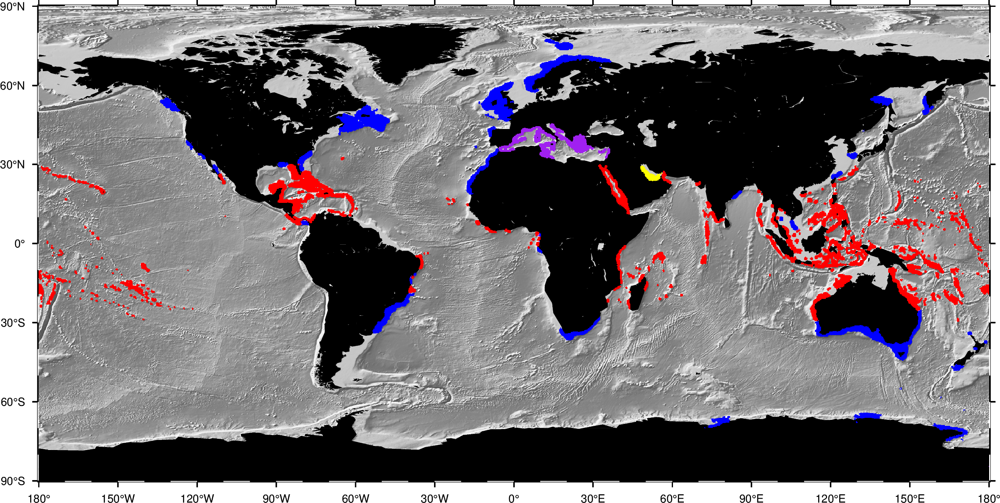

In [35]:
fig = pygmt.Figure()

pygmt.config(
    MAP_FRAME_WIDTH="0.5p",
    MAP_FRAME_TYPE="fancy",
)

# Plotting elevation
with pygmt.config(FONT='4p,Helvetica,black'):
    pygmt.makecpt(cmap="gray", series=[-15000, 4000])
    fig.basemap(region='d', projection="Q12c", frame='af') #'afg')
    
    fig.grdimage(photozoanDS.elevation, shading=True, frame=False) #,transparency=50)
    
    fig.coast(land="black")
    
    pygmt.makecpt(cmap="purple", series=[1, 4])
    fig.grdimage(photozoanDS.photoC, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="red", series=[1, 4])
    fig.grdimage(photozoanDS.photozoan, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="yellow", series=[1, 4])
    fig.grdimage(photozoanDS.biochemical, shading=False, nan_transparent=True, frame=False)
    
    pygmt.makecpt(cmap="blue", series=[1, 4])
    fig.grdimage(photozoanDS.heterozoan, shading=False, nan_transparent=True, frame=False)

    # fig.plot(x=select['finalLon'], y=select['finalLat'], style="c0.09c", pen="0.07p,black", fill="purple", label='Paleoreef Cells')

    
# with pygmt.config(FONT='6p,Helvetica,black'):
# #     fig.colorbar(position="jBC+o0c/-1.5c+w8c/0.3c+h",frame=["a5", "x+lalpha richness"])
#     fig.colorbar(position="JMR+o0.5c/0c+w4c/0.3c",frame=["a1", "x+lCarbonate Factory"])
    
fig.show(dpi=500, width=1000)
# fig.savefig('carbonate_factory.pdf',dpi=300)

## Simple SST projection

In [56]:
SSTprobDatasets = ebyteScenario.fuzzy_logic_projection(ebyte_matchingScenarios['Scotese2021_paleotemps'])
# SSTprobDatasets = scoteseScenario.fuzzy_logic_projection(scotese_matchingScenarios['Scotese2021_paleotemps'])

In [57]:
prefix = 'proj_earthByte_paleomag'
outdir = f'data/fuzzy_logic_projection/{prefix}'
if not os.path.exists(outdir):
    os.makedirs(outdir)

import rasterio as rio
for age, ds in SSTprobDatasets.items():
    # Remove the FillValue that xarray automaticcaly puts in (stuffs up some of the plotting)
    enc = {"_FillValue": None}
    encoding = {var:enc for var in ds.coords}
    ds.to_netcdf(os.path.join(outdir, f'{age}Ma.nc'), encoding=encoding)
    # ds['tempProb'][0][0].rio.to_raster(os.path.join(outdir, f'{age}Ma.tif'))


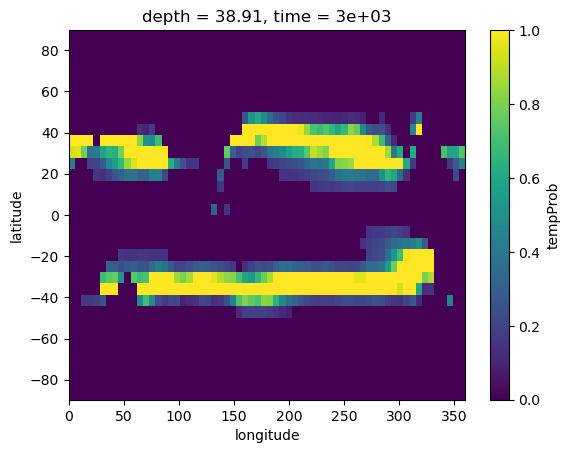

In [41]:
SSTprobDatasets[120]['tempProb'][0][0].plot()

## Get environmental rasters for biomod

In [ ]:
# reload(climateScenario)
# ebyteScenario = climateScenario.ClimateScenario(ebyteSimulationDirectory, co2s, ages)
ebyteScenario.get_environmental_rasters()


Error processing data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/100Ma_nc_outputs/3000-12-30_plasim.nc or data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/100Ma_nc_outputs/gold_spn_av_0000003000_00.nc: [Errno 2] No such file or directory: '/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows/data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/100Ma_nc_outputs/gold_spn_av_0000003000_00.nc'
Error processing data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/110Ma_nc_outputs/3000-12-30_plasim.nc or data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/110Ma_nc_outputs/gold_spn_av_0000003000_00.nc: [Errno 2] No such file or directory: '/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef

In [ ]:
# reload(climateScenario)

scoteseScenario.get_environmental_rasters()

Error processing data/climate_simulations/scotese/2024-10-08_realigned_scotese_paleo_shallowSea_4480/0Ma_nc_outputs/3000-12-30_plasim.nc or data/climate_simulations/scotese/2024-10-08_realigned_scotese_paleo_shallowSea_4480/0Ma_nc_outputs/gold_spn_av_0000003000_00.nc: [Errno 2] No such file or directory: '/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows/data/climate_simulations/scotese/2024-10-08_realigned_scotese_paleo_shallowSea_4480/0Ma_nc_outputs/gold_spn_av_0000003000_00.nc'
Error processing data/climate_simulations/scotese/2024-10-08_realigned_scotese_paleo_shallowSea_560/0Ma_nc_outputs/3000-12-30_plasim.nc or data/climate_simulations/scotese/2024-10-08_realigned_scotese_paleo_shallowSea_560/0Ma_nc_outputs/gold_spn_av_0000003000_00.nc: [Errno 2] No such file or directory: '/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows/data/climate_simulations/scotese/2024-10-08_realigned_s

## Testing biomod running

In [ ]:
# trainingDataFile = 'data/photozoan_locations/photozoan_filtered.csv'
trainingDataFile = 'data/photozoan_locations/photozoan_nearest_modelCoords.csv'
environmentalRastersPath = ebyteScenario.envRastersPath

data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/100Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_280/110Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_200/40Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_200/50Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_PaleomagRef_200/100Ma_nc_outputs/3000-12-30_plasim.nc does not exist, continuing but this may not work
data/climate_simulations/earthByte_paleomag/2024-07-23_realigned_earthbyte_paleo_P

In [ ]:
reload(getBiomodSDMs)
SDM_data_path = 'data/biomodSDM'
respName = 'photozoan'
ebyteBiomod = getBiomodSDMs.BiomodSDM(environmentalRastersPath, trainingDataFile, SDM_data_path, respName, ebyte_matchingScenarios['Scotese2021_paleotemps'])
scoteseBiomod = getBiomodSDMs.BiomodSDM(scoteseScenario.envRastersPath, trainingDataFile, SDM_data_path, respName, scotese_matchingScenarios['Scotese2021_paleotemps'])
# raster_paths = ebyteBiomod.load_env_raster_paths(matchingScenario)

vars_to_model = [
    'SST_annual',
    'SST_summer',
    'salinity_annual',
]

presentDayrasters = scoteseBiomod.load_present_env_rasters(vars_to_model)
pastRasters = scoteseBiomod.load_past_env_rasters_list(vars_to_model, ages = np.arange(0, 260, 10))


In [ ]:
scoteseBiomod.run_biomod_ensemble_model()
scoteseBiomod.run_biomod_ensemble_projection(ages=np.arange(0,260,10))

terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Formula をロード中です
要求されたパッケージ plot

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
 [1] "PARED_paleomap_time.csv"   "PARED_time.csv"           
 [3] "PARED_time_simple.csv"     "PARED_version1.xlsx"      
 [5] "biomodEnvRasters"          "climate_simulations"      
 [7] "fossils"                   "paleotemperature_datasets"
 [9] "pared_time_pmag.csv"       "pbdb_time_pmag.csv"       
[11] "photozoan_locations"       "rasters"                  
[13] "reconstructions"           "shapefile from pared.qgz" 
        lat      lon photozoan
1 -30.47071 165.9375         1
2 -30.47071 109.6875         1
3 -30.47071 216.5625         1
4 -30.47071 222.1875         1
5 -24.93032 216.5625         1
6 -24.93032 109.6875         1
      lat                lon            photozoan
 Min.   :-30.4707   Min.   :  2.812   Min.   :1  
 1st Qu.:-13.8500   1st Qu.:115.312   1st Qu.:1  
 Median :  2.7700   Median :160.312   Median :1  
 Mean   :  0.7315   Mean   :166.011   Mean   :1 

警告メッセージ:
.bm_ModelingOptions.check.args(data.type = data.type, models = models,  で:
  Only one GAM model can be activated. 'GAM.mgcv.gam' has been set (other available : 'GAM.gam.gam' or 'GAM.mgcv.bam')



   ! No models kept due to threshold filtering... Ensemble Modeling will fail!
   ! Note :  photozoan_EMmeanByTSS_mergedData_mergedRun_mergedAlgo failed!

   ! Note :  photozoan_EMcvByTSS_mergedData_mergedRun_mergedAlgo failed!

   ! Note :  photozoan_EMmedianByTSS_mergedData_mergedRun_mergedAlgo failed!

   ! Note :  photozoan_EMcaByTSS_mergedData_mergedRun_mergedAlgo failed!

   ! Note :  photozoan_EMwmeanByTSS_mergedData_mergedRun_mergedAlgo failed!

   ! Note :  photozoan_EMciInfByTSS_mergedData_mergedRun_mergedAlgo failed!

   ! Note :  photozoan_EMciSupByTSS_mergedData_mergedRun_mergedAlgo failed!

! All models failed                           full.name      PA    run    algo metric.eval cutoff
1             photozoan_PA1_RUN1_GAM     PA1   RUN1     GAM         TSS  427.0
2             photozoan_PA1_RUN1_GAM     PA1   RUN1     GAM         ROC  429.0
3             photozoan_PA1_RUN1_GAM     PA1   RUN1     GAM       KAPPA  531.0
4             photozoan_PA1_RUN1_GAM     PA1   RUN1 

No id variables; using all as measure variables


$tab
      id  expl.name     expl.val                  pred.name     pred.val
1      1   salinity  28.80415344     photozoan_PA1_RUN1_GAM 9.928708e-02
2      1   salinity  28.80415344      photozoan_PA1_RUN2_RF 1.900000e-01
3      1   salinity  28.80415344 photozoan_PA1_RUN2_XGBOOST 1.291787e-01
4      1   salinity  28.80415344     photozoan_PA1_RUN1_GLM 3.849810e-01
5      1   salinity  28.80415344     photozoan_PA1_RUN1_GBM 3.291752e-02
6      1   salinity  28.80415344     photozoan_PA1_RUN2_SRE 1.000000e+00
7      2   salinity  28.89786071      photozoan_PA1_RUN2_RF 1.900000e-01
8      2   salinity  28.89786071 photozoan_PA1_RUN2_XGBOOST 1.291787e-01
9      2   salinity  28.89786071     photozoan_PA1_RUN1_GLM 3.660377e-01
10     2   salinity  28.89786071     photozoan_PA1_RUN1_GBM 3.291752e-02
11     2   salinity  28.89786071     photozoan_PA1_RUN1_GAM 9.937235e-02
12     2   salinity  28.89786071     photozoan_PA1_RUN2_SRE 1.000000e+00
13     3   salinity  28.99156798     photozoan

警告メッセージ:
1: predict.gbm(get_formal_model(object), as.data.frame(newdata[not_na_rows,  で:
  Number of trees not specified or exceeded number fit so far. Using 100.
2: predict.gbm(get_formal_model(object), as.data.frame(newdata[not_na_rows,  で:
  Number of trees not specified or exceeded number fit so far. Using 100.
3: predict.gbm(get_formal_model(object), as.data.frame(newdata[not_na_rows,  で:
  Number of trees not specified or exceeded number fit so far. Using 100.
No id variables; using all as measure variables


  |======================================================================| 100%
$tab
      id  expl.name     expl.val                  pred.name     pred.val
1      1   salinity  28.80415344     photozoan_PA1_RUN1_GAM 7.259535e-04
2      1   salinity  28.80415344      photozoan_PA1_RUN2_RF 8.000000e-03
3      1   salinity  28.80415344 photozoan_PA1_RUN2_XGBOOST 1.256453e-01
4      1   salinity  28.80415344     photozoan_PA1_RUN1_GLM 2.220446e-16
5      1   salinity  28.80415344     photozoan_PA1_RUN1_GBM 3.291752e-02
6      1   salinity  28.80415344     photozoan_PA1_RUN2_SRE 1.000000e+00
7      2   salinity  28.89786071      photozoan_PA1_RUN2_RF 8.000000e-03
8      2   salinity  28.89786071 photozoan_PA1_RUN2_XGBOOST 1.256453e-01
9      2   salinity  28.89786071     photozoan_PA1_RUN1_GLM 2.220446e-16
10     2   salinity  28.89786071     photozoan_PA1_RUN1_GBM 3.291752e-02
11     2   salinity  28.89786071     photozoan_PA1_RUN1_GAM 7.266452e-04
12     2   salinity  28.89786071     ph

警告メッセージ:
1: predict.gbm(get_formal_model(object), as.data.frame(newdata[not_na_rows,  で:
  Number of trees not specified or exceeded number fit so far. Using 100.
2: predict.gbm(get_formal_model(object), as.data.frame(newdata[not_na_rows,  で:
  Number of trees not specified or exceeded number fit so far. Using 100.
3: predict.gbm(get_formal_model(object), as.data.frame(newdata[not_na_rows,  で:
  Number of trees not specified or exceeded number fit so far. Using 100.


$tab
      id  expl.name    expl.val                  comb              pred.name
1      1   salinity  28.8041534   salinity+SST_summer photozoan_PA1_RUN1_GLM
2      1 SST_summer  -1.7416992   salinity+SST_summer photozoan_PA1_RUN1_GLM
3      2   salinity  28.8041534   salinity+SST_summer photozoan_PA1_RUN1_GLM
4      2 SST_summer  -0.3863538   salinity+SST_summer photozoan_PA1_RUN1_GLM
5      3 SST_summer   0.9689916   salinity+SST_summer photozoan_PA1_RUN1_GLM
6      3   salinity  28.8041534   salinity+SST_summer photozoan_PA1_RUN1_GLM
7      4 SST_summer   2.3243370   salinity+SST_summer photozoan_PA1_RUN1_GLM
8      4   salinity  28.8041534   salinity+SST_summer photozoan_PA1_RUN1_GLM
9      5   salinity  28.8041534   salinity+SST_summer photozoan_PA1_RUN1_GLM
10     5 SST_summer   3.6796824   salinity+SST_summer photozoan_PA1_RUN1_GLM
11     6   salinity  28.8041534   salinity+SST_summer photozoan_PA1_RUN1_GLM
12     6 SST_summer   5.0350278   salinity+SST_summer photozoan_PA1_RUN

terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Formula をロード中です
要求されたパッケージ plot

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/280ppm/0Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/280ppm/0Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/280ppm/0Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ...
	> P

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/fosterCO2ppm/10Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/fosterCO2ppm/10Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/fosterCO2ppm/10Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/560ppm/20Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/560ppm/20Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/560ppm/20Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GBM ...
	

警告メッセージ:
1: [writeRaster] detected values outside of the limits of datatype INT2S 
2: [writeRaster] detected values outside of the limits of datatype INT2S 
3: [writeRaster] detected values outside of the limits of datatype INT2S 
4: [writeRaster] detected values outside of the limits of datatype INT2S 
5: [writeRaster] detected values outside of the limits of datatype INT2S 
6: [writeRaster] detected values outside of the limits of datatype INT2S 




! Binary/Filtered transformation automatically desactivated for ensemble models with coefficient of variation or confidence intervals
	> Building TSS binaries / filtered
	> Building ROC binaries / filtered
	> Building KAPPA binaries / filtered
	> Building SR binaries / filtered
	> Building ACCURACY binaries / filtered

-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-= Done -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=


警告メッセージ:
1: [writeRaster] detected values outside of the limits of datatype INT2S 
2: [writeRaster] detected values outside of the limits of datatype INT2S 
3: [writeRaster] detected values outside of the limits of datatype INT2S 
4: [writeRaster] detected values outside of the limits of datatype INT2S 
5: [writeRaster] detected values outside of the limits of datatype INT2S 
要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview typ

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/560ppm/30Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/560ppm/30Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/560ppm/30Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ...
	

警告メッセージ:
1: [writeRaster] detected values outside of the limits of datatype INT2S 
2: [writeRaster] detected values outside of the limits of datatype INT2S 
3: [writeRaster] detected values outside of the limits of datatype INT2S 
4: [writeRaster] detected values outside of the limits of datatype INT2S 
5: [writeRaster] detected values outside of the limits of datatype INT2S 
6: [writeRaster] detected values outside of the limits of datatype INT2S 




! Binary/Filtered transformation automatically desactivated for ensemble models with coefficient of variation or confidence intervals
	> Building TSS binaries / filtered
	> Building ROC binaries / filtered
	> Building KAPPA binaries / filtered
	> Building SR binaries / filtered
	> Building ACCURACY binaries / filtered

-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-= Done -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=


警告メッセージ:
1: [writeRaster] detected values outside of the limits of datatype INT2S 
2: [writeRaster] detected values outside of the limits of datatype INT2S 
3: [writeRaster] detected values outside of the limits of datatype INT2S 
4: [writeRaster] detected values outside of the limits of datatype INT2S 
5: [writeRaster] detected values outside of the limits of datatype INT2S 
要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview typ

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/fosterCO2ppm/40Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/fosterCO2ppm/40Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/fosterCO2ppm/40Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/2240ppm/50Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/2240ppm/50Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/2240ppm/50Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ..

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/1120ppm/60Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/1120ppm/60Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/1120ppm/60Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GBM ..

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/560ppm/70Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/560ppm/70Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/560ppm/70Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ...
	

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/1120ppm/80Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/1120ppm/80Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/1120ppm/80Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ..

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/4480ppm/90Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/4480ppm/90Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/4480ppm/90Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ..

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/1120ppm/100Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/1120ppm/100Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/1120ppm/100Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/1120ppm/110Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/1120ppm/110Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/1120ppm/110Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/2240ppm/120Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/2240ppm/120Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/2240ppm/120Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/fosterCO2ppm/130Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/fosterCO2ppm/130Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/fosterCO2ppm/130Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/560ppm/140Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/560ppm/140Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/560ppm/140Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ..

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/fosterCO2ppm/150Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/fosterCO2ppm/150Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/fosterCO2ppm/150Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan

警告メッセージ:
1: [writeRaster] detected values outside of the limits of datatype INT2S 
2: [writeRaster] detected values outside of the limits of datatype INT2S 
3: [writeRaster] detected values outside of the limits of datatype INT2S 
4: [writeRaster] detected values outside of the limits of datatype INT2S 
5: [writeRaster] detected values outside of the limits of datatype INT2S 
6: [writeRaster] detected values outside of the limits of datatype INT2S 




! Binary/Filtered transformation automatically desactivated for ensemble models with coefficient of variation or confidence intervals
	> Building TSS binaries / filtered
	> Building ROC binaries / filtered
	> Building KAPPA binaries / filtered
	> Building SR binaries / filtered
	> Building ACCURACY binaries / filtered

-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-= Done -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=


警告メッセージ:
1: [writeRaster] detected values outside of the limits of datatype INT2S 
2: [writeRaster] detected values outside of the limits of datatype INT2S 
3: [writeRaster] detected values outside of the limits of datatype INT2S 
4: [writeRaster] detected values outside of the limits of datatype INT2S 
5: [writeRaster] detected values outside of the limits of datatype INT2S 
要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview typ

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/560ppm/160Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/560ppm/160Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/560ppm/160Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM ..

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/1120ppm/170Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/1120ppm/170Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/1120ppm/170Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting
	> Projecting  photozoan_PA1_RUN2_GBMphotozoan_PA1_RUN2_GLM  ......
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/1120ppm/180Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/1120ppm/180Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/1120ppm/180Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/1120ppm/190Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/1120ppm/190Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/1120ppm/190Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/fosterCO2ppm/200Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/fosterCO2ppm/200Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/fosterCO2ppm/200Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/2240ppm/210Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/2240ppm/210Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/2240ppm/210Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/fosterCO2ppm/220Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/fosterCO2ppm/220Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/fosterCO2ppm/220Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/fosterCO2ppm/230Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/fosterCO2ppm/230Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/fosterCO2ppm/230Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/2240ppm/240Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/2240ppm/240Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/2240ppm/240Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/scotese/4480ppm/250Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/scotese/4480ppm/250Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/scotese/4480ppm/250Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_allRun_GBM

要求されたパッケージ tidyterra をロード中です


terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Formula をロード中です
要求されたパッケージ plot

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/280ppm/0Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/280ppm/0Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/280ppm/0Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting 

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/10Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/10Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/10Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_G

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/20Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/20Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/20Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_G

警告メッセージ:
1: [writeRaster] detected values outside of the limits of datatype INT2S 
2: [writeRaster] detected values outside of the limits of datatype INT2S 
3: [writeRaster] detected values outside of the limits of datatype INT2S 
4: [writeRaster] detected values outside of the limits of datatype INT2S 
5: [writeRaster] detected values outside of the limits of datatype INT2S 
6: [writeRaster] detected values outside of the limits of datatype INT2S 




! Binary/Filtered transformation automatically desactivated for ensemble models with coefficient of variation or confidence intervals
	> Building TSS binaries / filtered
	> Building ROC binaries / filtered
	> Building KAPPA binaries / filtered
	> Building SR binaries / filtered
	> Building ACCURACY binaries / filtered

-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-= Done -=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=-=


要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/560ppm/30Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/560ppm/30Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/560ppm/30Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecti

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/40Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/40Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/fosterCO2ppm/40Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOO

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/2240ppm/50Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/2240ppm/50Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/2240ppm/50Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Proje

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/1120ppm/60Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/1120ppm/60Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/1120ppm/60Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Proje

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/560ppm/70Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/560ppm/70Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/560ppm/70Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecti

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/1120ppm/80Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/1120ppm/80Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/1120ppm/80Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Proje

要求されたパッケージ tidyterra をロード中です
terra 1.7.78
biomod2 4.2-6-1 loaded.
 /!\ Be careful : note that some BigBoss options have been changed between biomod2 v4.2-6 and previous versions./!\ 
                  

 Please welcome a new model : RFd. This is a random forest model with a automatic down sampling to make your life easier.

要求されたパッケージ nnet をロード中です
要求されたパッケージ rpart をロード中です
要求されたパッケージ mda をロード中です
要求されたパッケージ class をロード中です
Loaded mda 0.5-4

要求されたパッケージ gam をロード中です
要求されたパッケージ splines をロード中です
要求されたパッケージ foreach をロード中です
Loaded gam 1.22-3

要求されたパッケージ mgcv をロード中です
要求されたパッケージ nlme をロード中です
This is mgcv 1.9-1. For overview type 'help("mgcv-package")'.

次のパッケージを付け加えます: ‘mgcv’

以下のオブジェクトは ‘package:gam’ からマスクされています:

    gam, gam.control, gam.fit, s

以下のオブジェクトは ‘package:nnet’ からマスクされています:

    multinom

要求されたパッケージ gbm をロード中です
Loaded gbm 2.2.2
This version of gbm is no longer under development. Consider transitioning to gbm3, https://github.com/gbm-developers/gbm3
要求されたパッケージ earth をロード中です
要求されたパッケージ Fo

[1] "/Users/jono/Library/CloudStorage/OneDrive-TheUniversityofSydney(Staff)/paleoReef/plasimGenieWorkflows"
[1] "data/biomodEnvRasters/earthByte_paleomag/2240ppm/90Ma_envRaster/salinity_annual.tif"
[2] "data/biomodEnvRasters/earthByte_paleomag/2240ppm/90Ma_envRaster/SST_summer.tif"     
[3] "data/biomodEnvRasters/earthByte_paleomag/2240ppm/90Ma_envRaster/SST_annual.tif"     
[1] 3

-=-=-=-=-=-=-=-=-=-=-=-=-= Do Single Models Projection -=-=-=-=-=-=-=-=-=-=-=-=-=

	> Building clamping mask

	> Projecting photozoan_PA1_RUN1_GAM ...
	> Projecting photozoan_PA1_RUN1_GBM ...
	> Projecting photozoan_PA1_RUN1_GLM ...
	> Projecting photozoan_PA1_RUN1_MARS ...
	> Projecting photozoan_PA1_RUN1_RF ...
	> Projecting photozoan_PA1_RUN1_SRE ...
	> Projecting photozoan_PA1_RUN2_RF ...
	> Projecting photozoan_PA1_RUN2_GAM ...
	> Projecting photozoan_PA1_RUN2_GBM ...
	> Projecting photozoan_PA1_RUN2_GLM ...
	> Projecting photozoan_PA1_allRun_GAM ...
	> Projecting photozoan_PA1_RUN1_XGBOOST ...
	> Proje

要求されたパッケージ tidyterra をロード中です

実行が停止されました 


KeyboardInterrupt: 